# Wasserstein GAN with Gradient Penalty
## For generation of features based on LHCO2020 datasets

In [30]:
import h5py as h5
import numpy as np
from math import ceil, floor, isnan
import random
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras import layers
import keras.backend as K
import gc
print(tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(len(physical_devices))
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print(physical_devices[0])

tf.random.set_seed(1234)

2.1.0
1
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [31]:
filenames = {
    "herwig": "GAN-data\events_anomalydetection_DelphesHerwig_qcd_features.h5",
    "pythiabg": "GAN-data\events_anomalydetection_DelphesPythia8_v2_qcd_features.h5",
    "pythiasig": "GAN-data\events_anomalydetection_DelphesPythia8_v2_Wprime_features.h5"
}

datatypes = ["herwig", "pythiabg", "pythiasig"]

train_features = ["mj2", "mjdelta", "tau21j1", "tau21j2", "mjj", "ejj", "pjj", "ej1", "pj1", "ej2", "pj2"] # Can be flexibly changed to suit GAN needs

In [32]:
def load_data(datatype, stop = None):
    input_frame = pd.read_hdf(filenames[datatype], stop = stop)
    output_frame = input_frame.copy()
    features = ["px", "py", "pz", "m", "tau1", "tau2", "tau3"]
    for feature in features:
        output_frame[feature + "j1"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j1"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j2"]
        output_frame[feature + "j2"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j2"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j1"]
    del input_frame
    gc.collect()
    output_frame["mjdelta"] = output_frame["mj1"] - output_frame["mj2"]
    output_frame["pj1"] = np.sqrt(output_frame["pxj1"]**2 + output_frame["pyj1"]**2 + output_frame["pzj1"]**2)
    output_frame["pj2"] = np.sqrt(output_frame["pxj2"]**2 + output_frame["pyj2"]**2 + output_frame["pzj2"]**2)
    output_frame["ej1"] = np.sqrt(output_frame["mj1"]**2 + output_frame["pj1"]**2)
    output_frame["ej2"] = np.sqrt(output_frame["mj2"]**2 + output_frame["pj2"]**2)
    output_frame["ejj"] = output_frame["ej1"] + output_frame["ej2"]
    output_frame["pjj"] = np.sqrt((output_frame["pxj1"] + output_frame["pxj2"])**2 + (output_frame["pyj1"] + output_frame["pyj2"])**2 + (output_frame["pzj1"] + output_frame["pzj2"])**2)
    output_frame["mjj"] = np.sqrt(output_frame["ejj"]**2 - output_frame["pjj"]**2)
    output_frame["tau21j1"] = output_frame["tau2j1"] / output_frame["tau1j1"]
    output_frame["tau32j1"] = output_frame["tau3j1"] / output_frame["tau2j1"]
    output_frame["tau21j2"] = output_frame["tau2j2"] / output_frame["tau1j2"]
    output_frame["tau32j2"] = output_frame["tau3j2"] / output_frame["tau2j2"]
    return output_frame

In [33]:
# Network hyperparameters
BATCH_SIZE = 2048
EPOCHS = 2000

# Adam hyperparameters as recommended by arXiv:1704.00028
LEARNING_RATE = 1e-4
BETA_1 = 0
BETA_2 = 0.9

# WGAN hyperparameters
N_CRITIC = 5
C_LAMBDA = 10

In [34]:
df = load_data("herwig")

# Ensures all batches have same size

df.dropna(inplace = True)
df.drop([i for i in range(df.shape[0] % (BATCH_SIZE * 4))], inplace = True)
df.reset_index(drop = True, inplace = True)
df = df.astype('float32')

In [35]:
# Normalize all inputs between -1 and 1

scaler = MinMaxScaler((-1,1)).fit(df[train_features])
feature_df = scaler.transform(df[train_features])

X_train, X_test = train_test_split(feature_df, test_size = 0.25, random_state = 1234)
len_dataset = int(X_train.shape[0] / BATCH_SIZE)
len_testset = int(X_test.shape[0] / BATCH_SIZE)
print("Dataset consists of {} batches of {} samples each, total {} samples".format(len_dataset, BATCH_SIZE, len_dataset * BATCH_SIZE))
print("Testset consists of {} batches of {} samples each, total {} samples".format(len_testset, BATCH_SIZE, len_testset * BATCH_SIZE))

del df
gc.collect()

Dataset consists of 366 batches of 2048 samples each, total 749568 samples
Testset consists of 122 batches of 2048 samples each, total 249856 samples


0

In [36]:
train_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_train)).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_test)).batch(BATCH_SIZE)

In [37]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(len(train_features), activation='tanh'))
    assert model.output_shape == (None, len(train_features))

    return model

In [38]:
generator = make_generator_model()

In [39]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(50))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(1)) # WGAN: No sigmoid activation in last layer

    return model

In [40]:
discriminator = make_discriminator_model()

In [41]:
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 50)                600       
_________________________________________________________________
batch_normalization_3 (Batch (None, 50)                200       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 50)                2550      
_________________________________________________________________
batch_normalization_4 (Batch (None, 50)                200       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 50)               

In [42]:
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 50)                600       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 50)                2550      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                

In [43]:
@tf.function
def gradient_penalty(real, fake, epsilon): 
    # mixed_images = real * epsilon + fake * (1 - epsilon)
    mixed_images = fake + epsilon * (real - fake)
    with tf.GradientTape() as tape:
        tape.watch(mixed_images) 
        mixed_scores = discriminator(mixed_images)
        
    gradient = tape.gradient(mixed_scores, mixed_images)[0]
    
    gradient_norm = tf.norm(gradient)
    penalty = tf.math.reduce_mean((gradient_norm - 1)**2)
    return penalty

In [44]:
@tf.function
def discriminator_loss(real_output, fake_output, gradient_penalty):
    loss = tf.math.reduce_mean(fake_output) - tf.math.reduce_mean(real_output) + C_LAMBDA * gradient_penalty
    return loss

In [45]:
@tf.function
def generator_loss(fake_output):
    gen_loss = -1. * tf.math.reduce_mean(fake_output)
    return gen_loss

In [46]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1, beta_2=BETA_2)

In [47]:
# Convert tensor to float for loss function plotting
def K_eval(x):
    try:
        return K.get_value(K.to_dense(x))
    except:
        eval_fn = K.function([], [x])
        return eval_fn([])[0]

In [48]:
@tf.function
def train_step_generator():
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    fake_output = discriminator(generated_images, training=True)
    gen_loss = generator_loss(fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  
  return gen_loss

In [49]:
@tf.function
def train_step_discriminator(images):
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return disc_loss

In [50]:
@tf.function
def evaluate_generator():
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    fake_output = discriminator(generated_images, training=False)

    gen_loss = generator_loss(fake_output)

    return gen_loss

In [51]:
@tf.function
def evaluate_discriminator(images):
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    real_output = discriminator(images, training=False)
    fake_output = discriminator(generated_images, training=False)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

    return disc_loss

In [52]:
def graph_gan(generator):
    realdata = scaler.inverse_transform(X_train)
    fakedata = scaler.inverse_transform(generator(tf.random.normal((10000, len(train_features))), training=False))
    
    plt.title("Subleading Jet Mass")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_2}$")
    plt.hist(realdata[:,0], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,0], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("Leading-Subleading Jet Mass Delta")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_1}-m_{J_2}$")
    plt.hist(realdata[:,1], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,1], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_1}$")
    plt.hist(realdata[:,2], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,2], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()
    
    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_2}$")
    plt.hist(realdata[:,3], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,3], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

In [53]:
train_gen_losses = []
train_disc_losses = []
test_gen_losses = []
test_disc_losses = []

In [54]:
def graph_genloss():
    plt.title("Generator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_gen_losses, 'b', label = "Training loss")
    plt.plot(test_gen_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [55]:
def graph_discloss():
    plt.title("Discriminator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_disc_losses, 'b', label = "Training loss")
    plt.plot(test_disc_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [56]:
def train(dataset, testset, epochs, n_critic):
  for epoch in tqdm(range(epochs)):
    print_losses = False #((epoch + 1) % 10 == 0)
    draw_outputs = ((epoch + 1) % 50 == 0)

    train_gen_loss = 0
    train_disc_loss = 0

    test_gen_loss = 0
    test_disc_loss = 0

    # Training

    for batchnum, image_batch in enumerate(dataset):
      if random.random() < 1 / n_critic:
        train_gen_loss += K_eval(train_step_generator()) / len_dataset * n_critic
      train_disc_loss += K_eval(train_step_discriminator(image_batch)) / len_dataset
    
    train_gen_losses.append(train_gen_loss)
    train_disc_losses.append(train_disc_loss)

    # Evaluation

    for batchnum, test_batch in enumerate(testset):
      test_gen_loss += K_eval(evaluate_generator()) / len_testset
      test_disc_loss += K_eval(evaluate_discriminator(test_batch)) / len_testset

    test_gen_losses.append(test_gen_loss)
    test_disc_losses.append(test_disc_loss)

    # Logging

    if print_losses:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      print()
      print("Generator training loss: " + str(train_gen_losses[-1]))
      print("Discriminator training loss: " + str(train_disc_losses[-1]))
      print()
      print("Generator validation loss: " + str(test_gen_losses[-1]))
      print("Discriminator validation loss: " + str(test_disc_losses[-1]))

    if draw_outputs:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      graph_gan(generator)
      graph_genloss()
      graph_discloss()

  2%|▏         | 49/2000 [01:37<1:03:09,  1.94s/it]
Epoch 50:


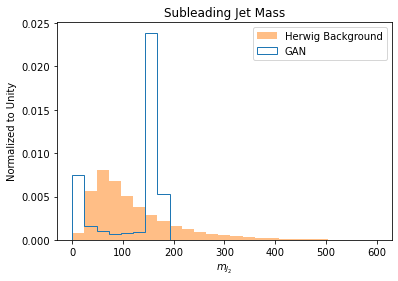

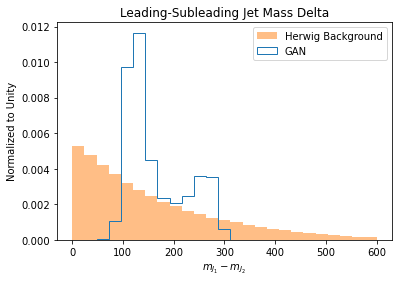

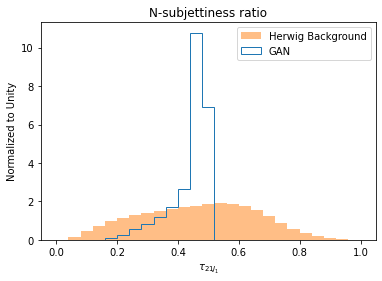

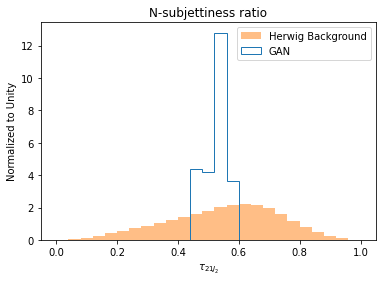

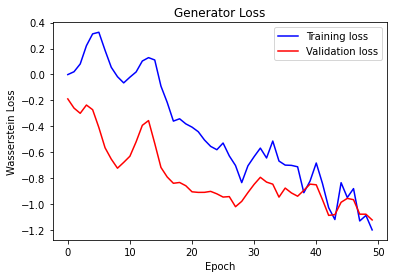

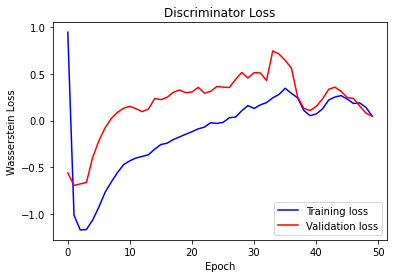

  5%|▍         | 99/2000 [03:13<59:09,  1.87s/it]
Epoch 100:


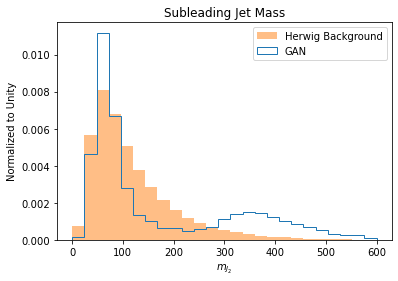

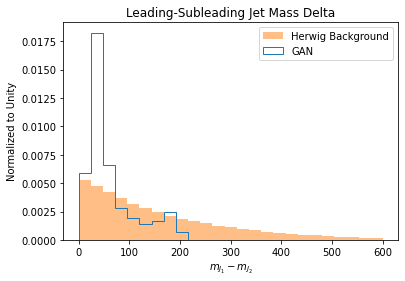

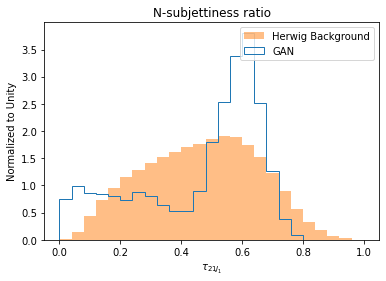

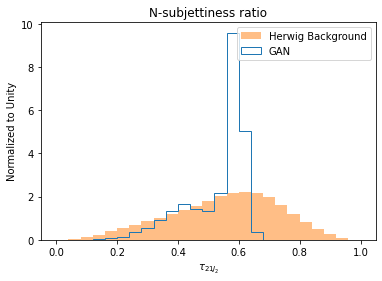

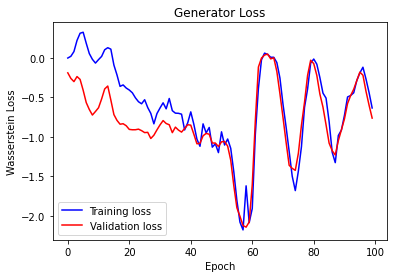

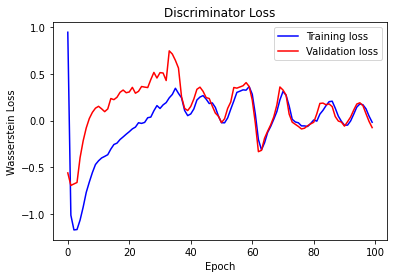

  7%|▋         | 149/2000 [04:50<58:40,  1.90s/it]
Epoch 150:


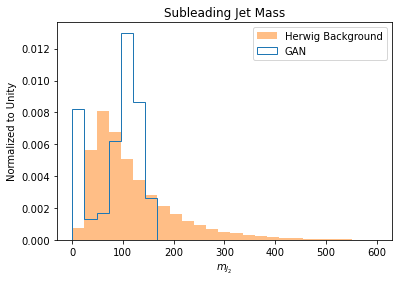

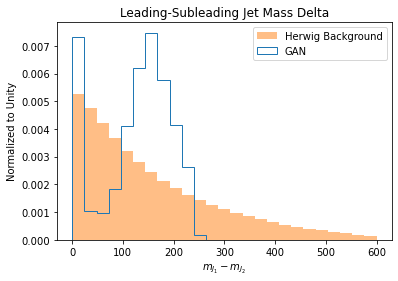

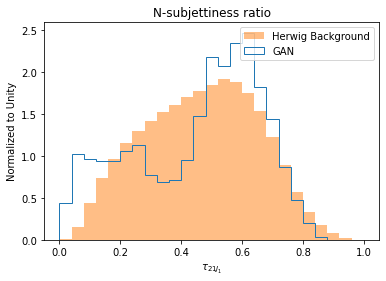

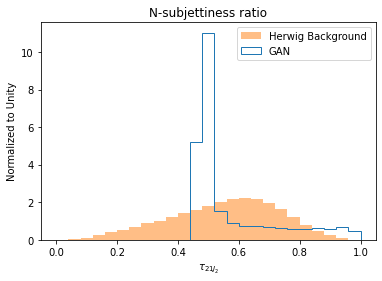

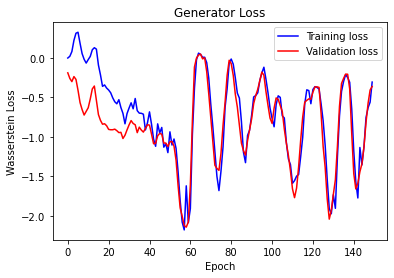

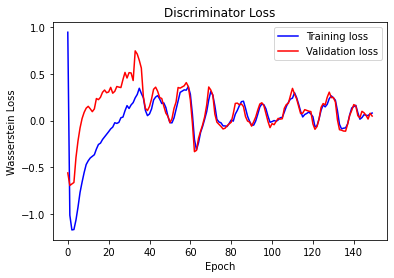

 10%|▉         | 199/2000 [06:31<1:02:43,  2.09s/it]
Epoch 200:


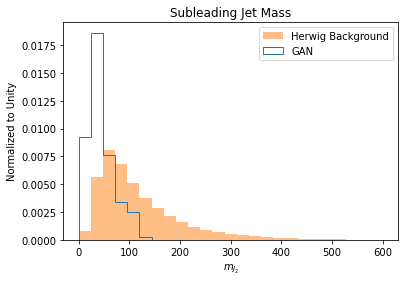

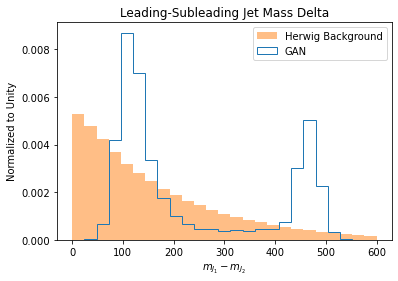

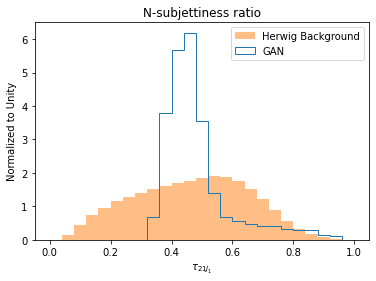

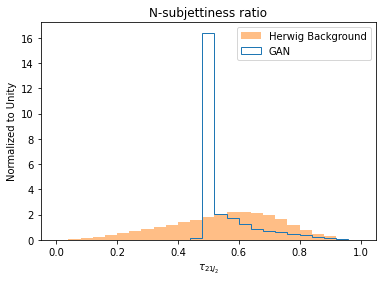

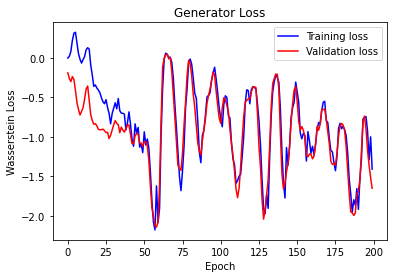

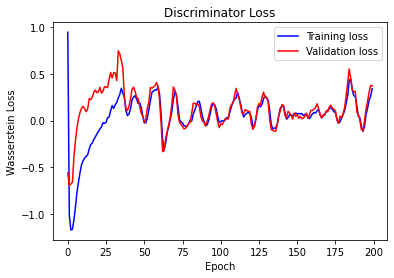

 12%|█▏        | 249/2000 [08:12<57:15,  1.96s/it]
Epoch 250:


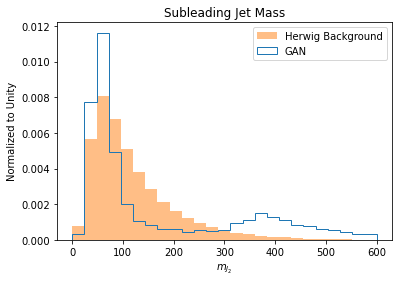

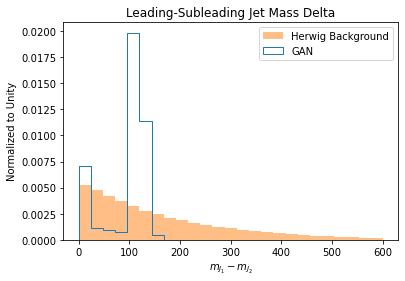

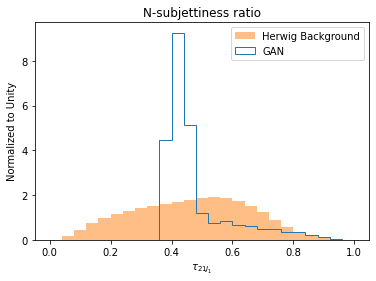

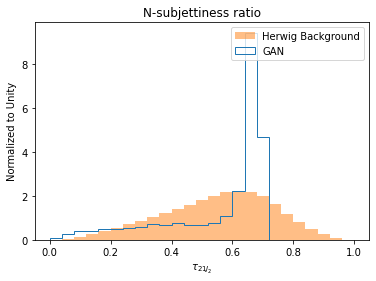

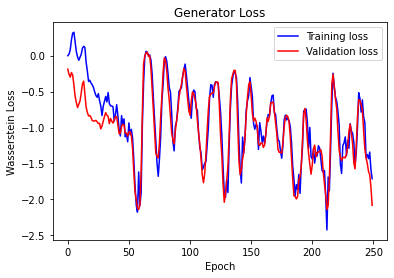

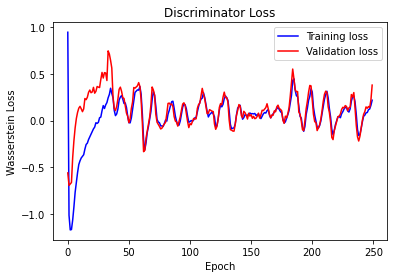

 15%|█▍        | 299/2000 [09:52<55:57,  1.97s/it]
Epoch 300:


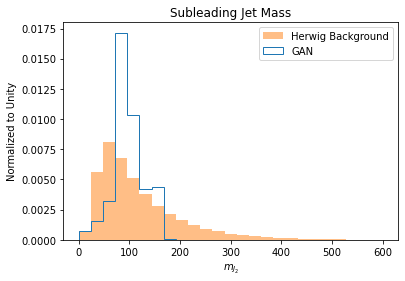

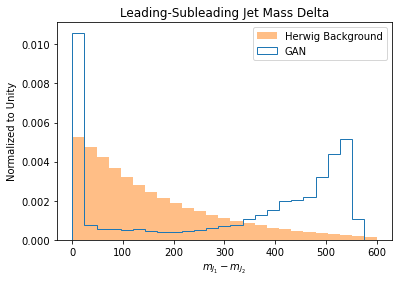

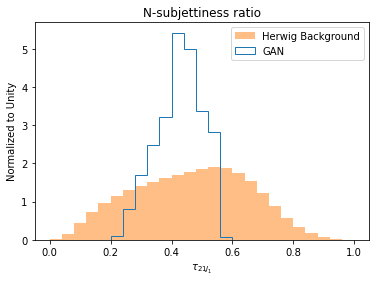

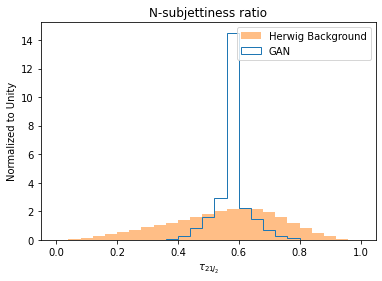

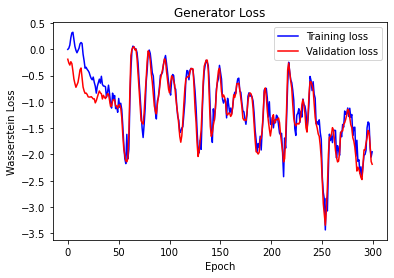

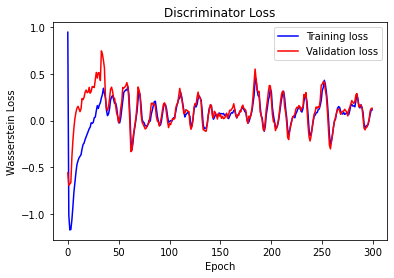

 17%|█▋        | 349/2000 [11:34<55:16,  2.01s/it]
Epoch 350:


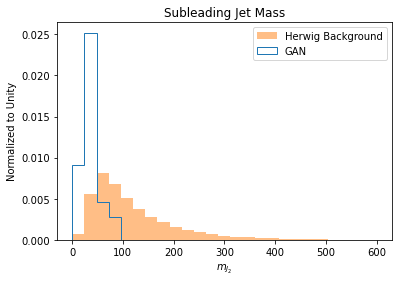

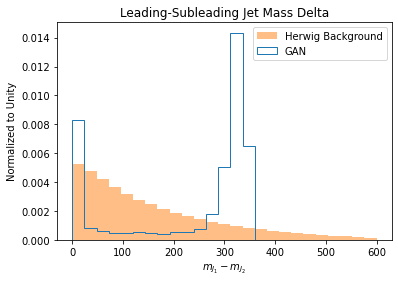

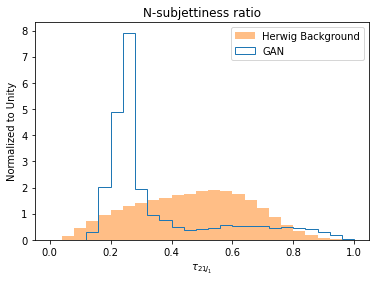

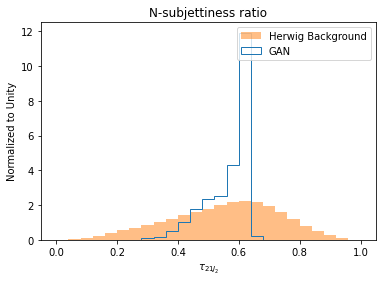

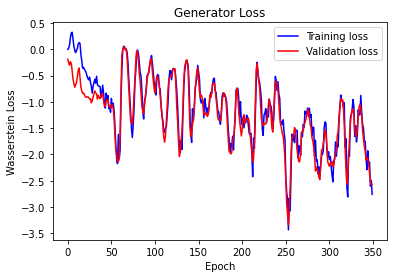

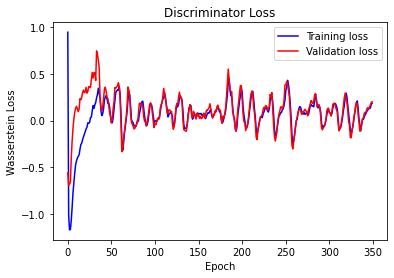

 20%|█▉        | 399/2000 [13:15<53:04,  1.99s/it]
Epoch 400:


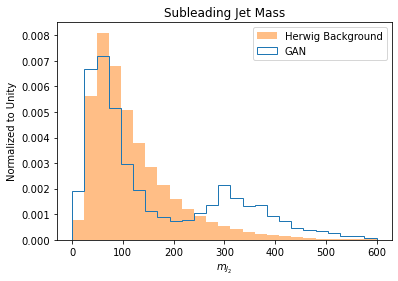

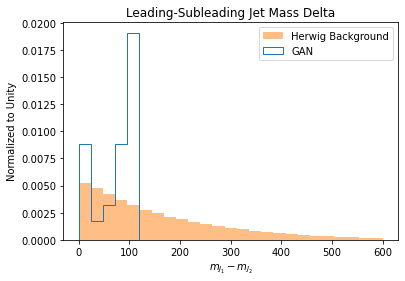

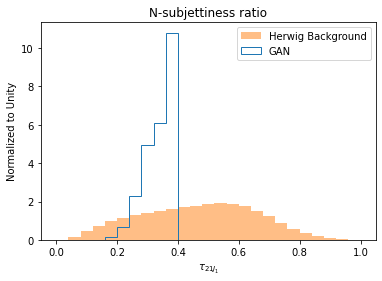

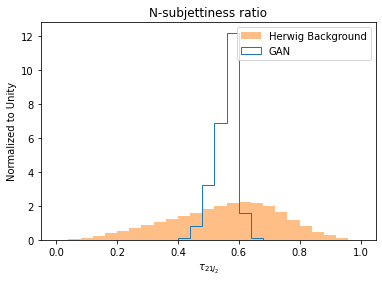

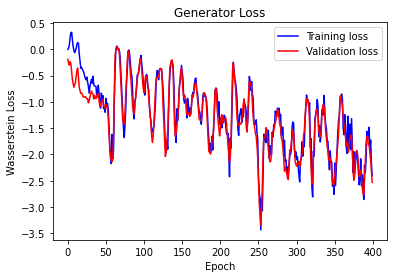

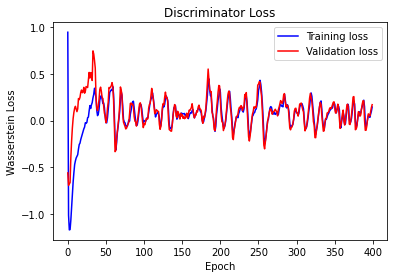

 22%|██▏       | 449/2000 [15:01<51:34,  2.00s/it]
Epoch 450:


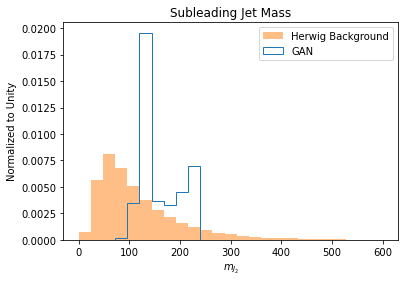

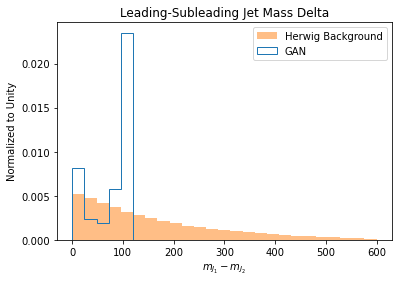

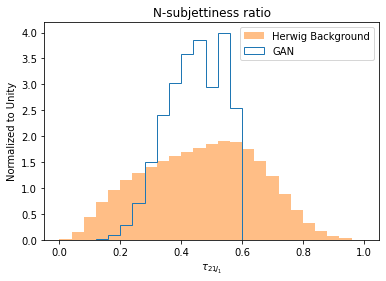

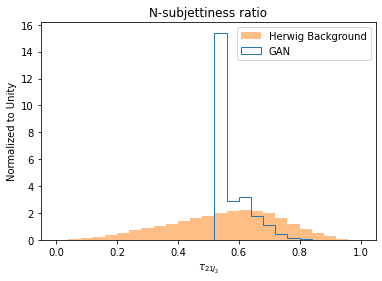

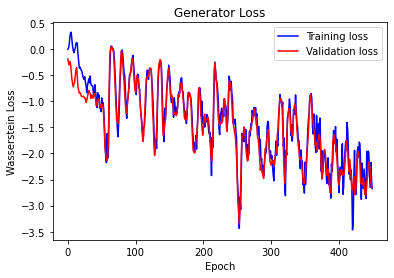

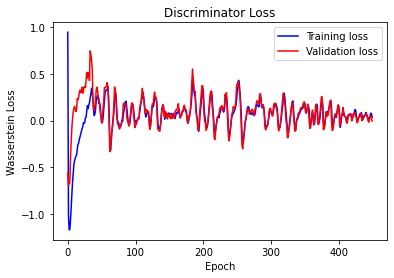

 25%|██▍       | 499/2000 [16:43<50:12,  2.01s/it]
Epoch 500:


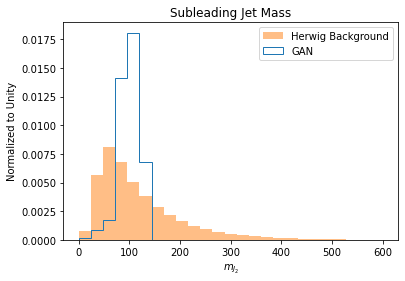

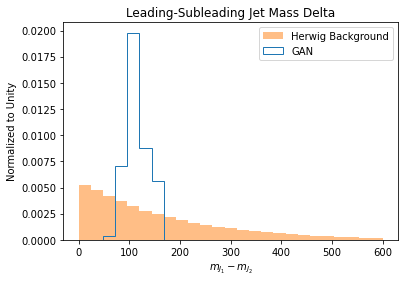

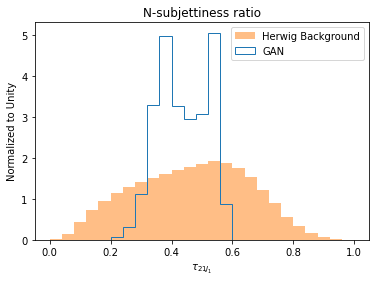

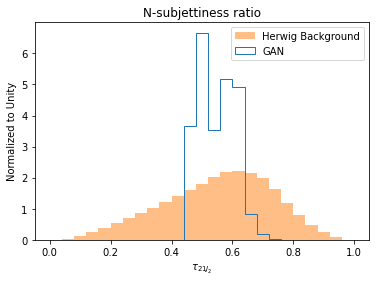

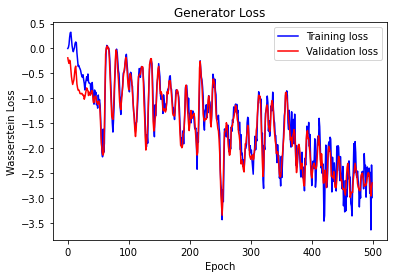

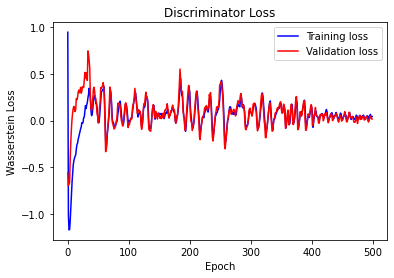

 27%|██▋       | 549/2000 [18:27<48:26,  2.00s/it]
Epoch 550:


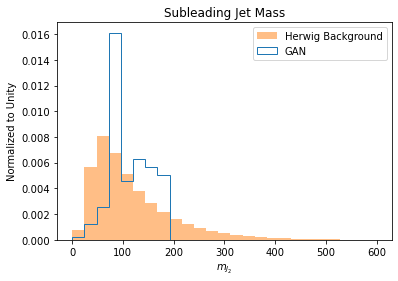

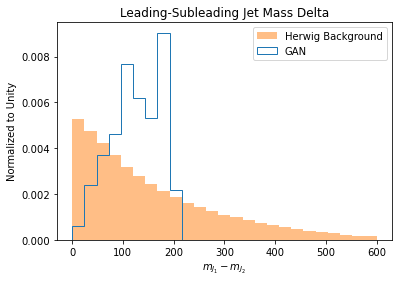

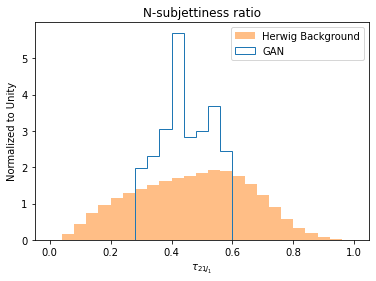

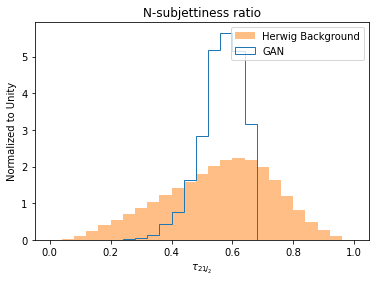

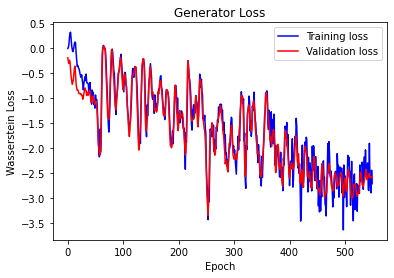

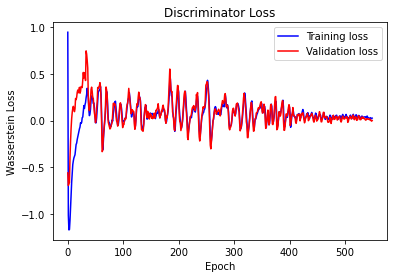

 30%|██▉       | 599/2000 [20:09<46:26,  1.99s/it]
Epoch 600:


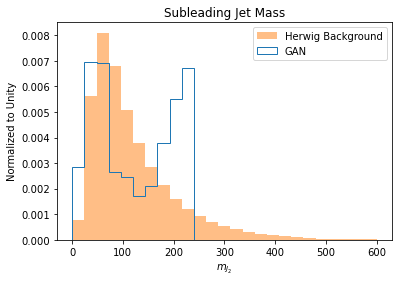

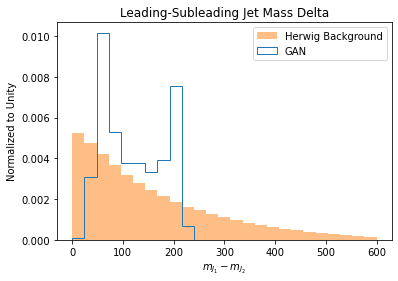

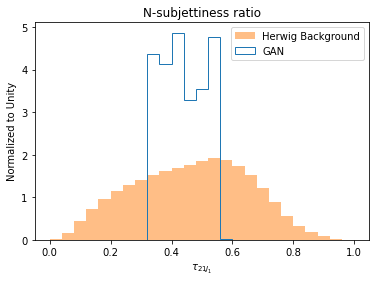

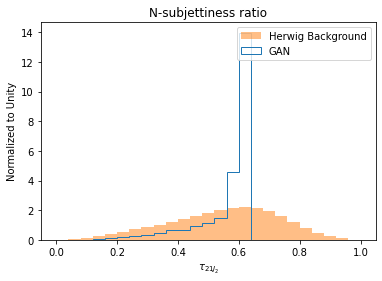

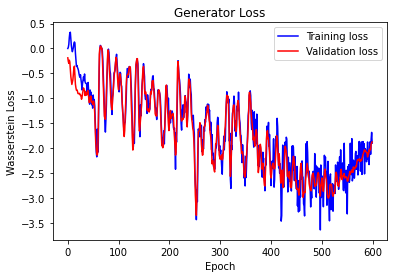

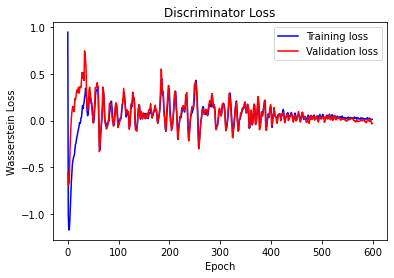

 32%|███▏      | 649/2000 [21:52<45:38,  2.03s/it]
Epoch 650:


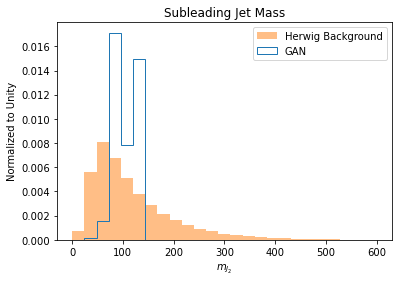

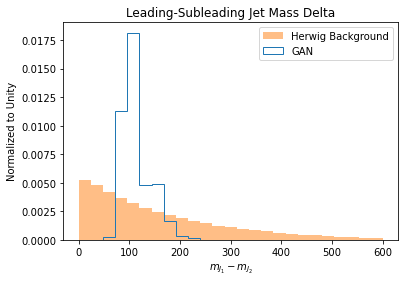

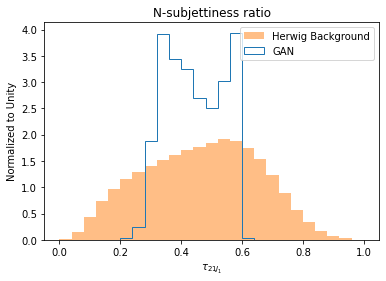

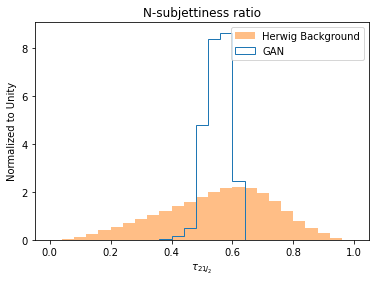

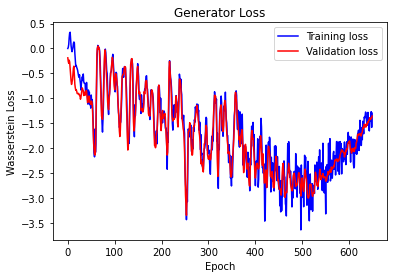

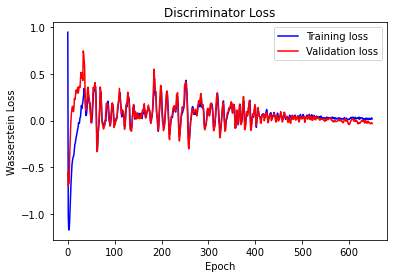

 35%|███▍      | 699/2000 [23:36<43:21,  2.00s/it]
Epoch 700:


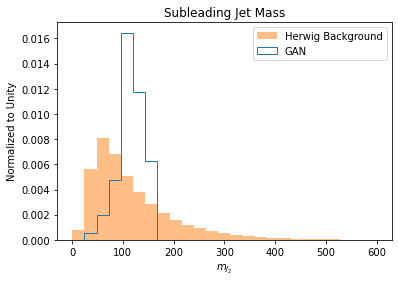

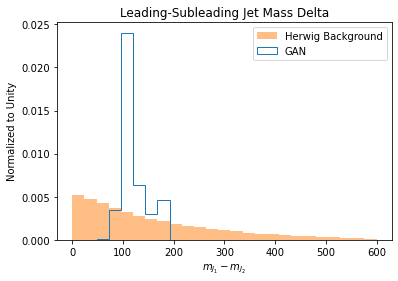

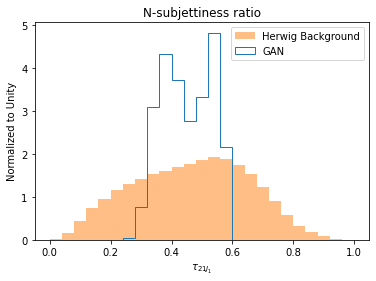

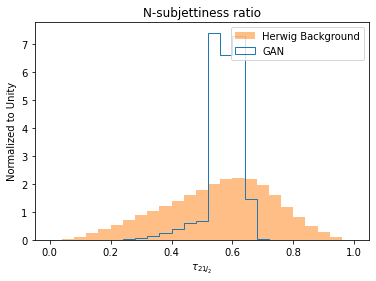

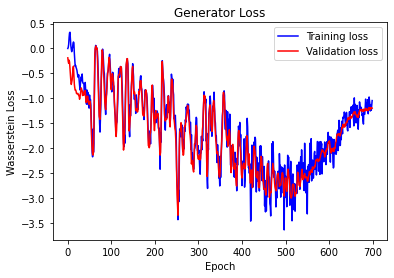

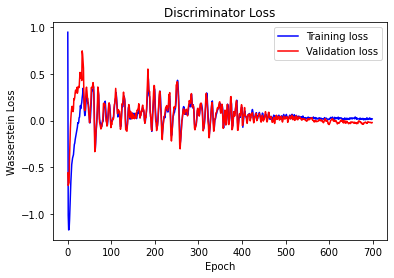

 37%|███▋      | 749/2000 [25:18<41:25,  1.99s/it]
Epoch 750:


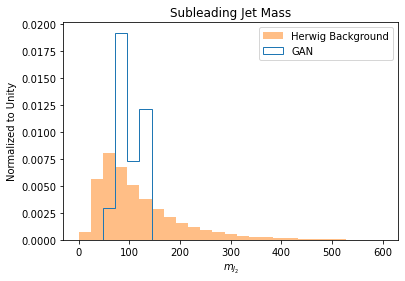

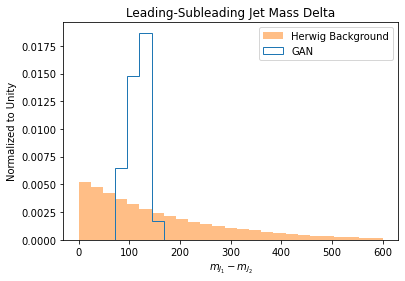

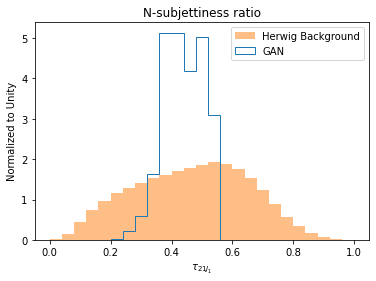

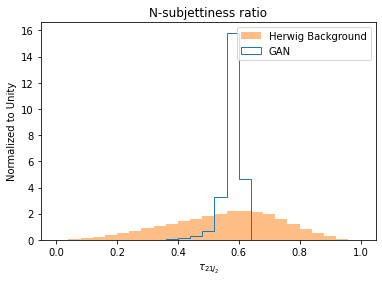

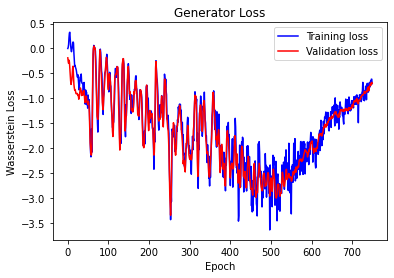

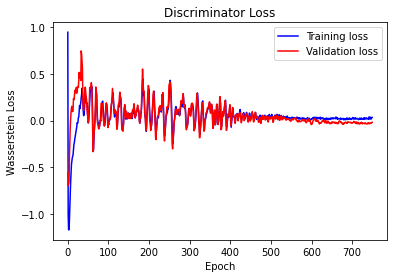

 40%|███▉      | 799/2000 [27:01<40:29,  2.02s/it]
Epoch 800:


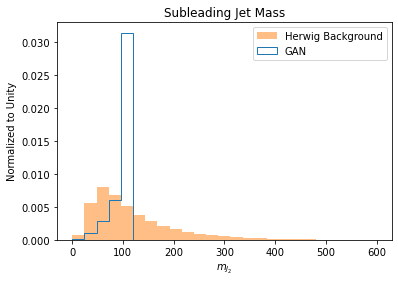

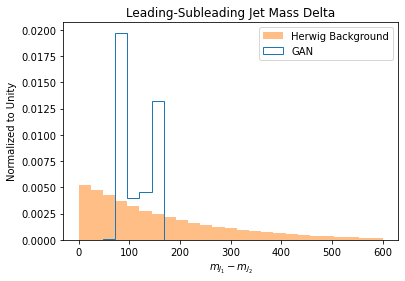

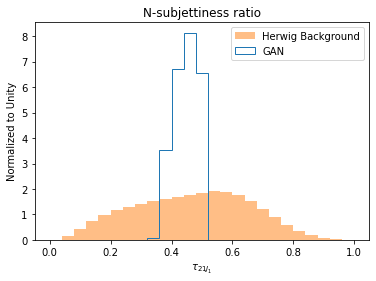

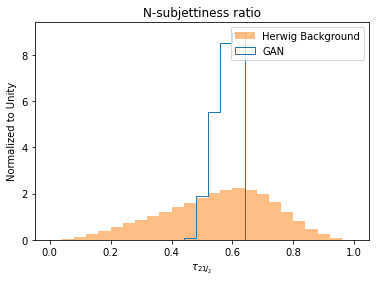

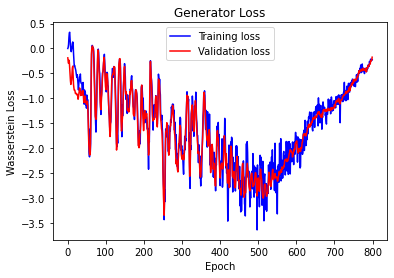

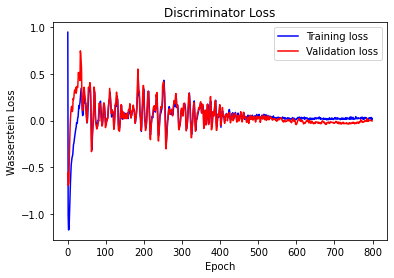

 42%|████▏     | 849/2000 [28:44<38:43,  2.02s/it]
Epoch 850:


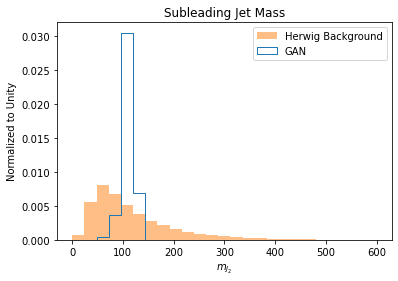

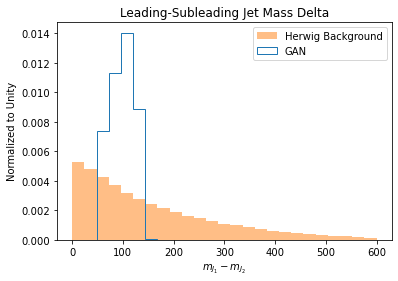

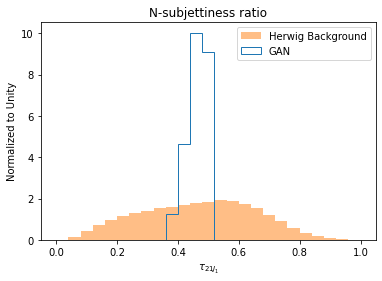

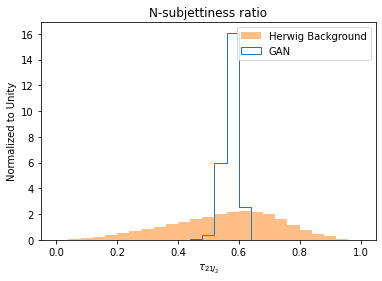

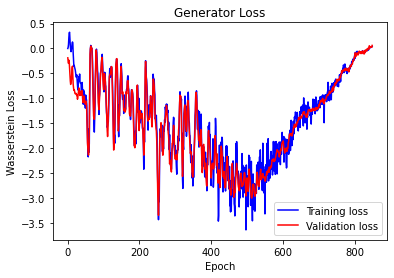

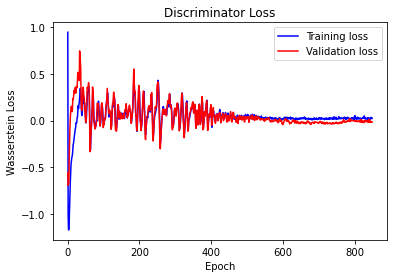

 45%|████▍     | 899/2000 [30:29<37:35,  2.05s/it]
Epoch 900:


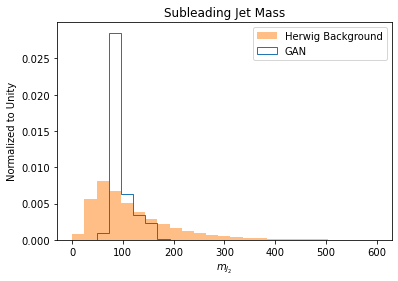

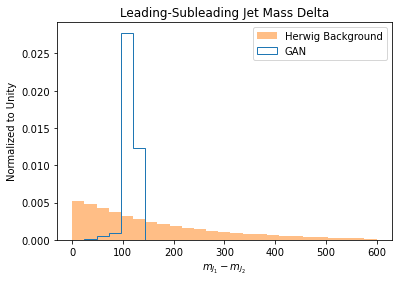

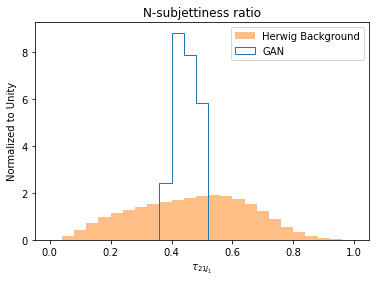

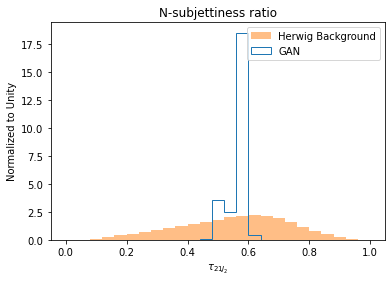

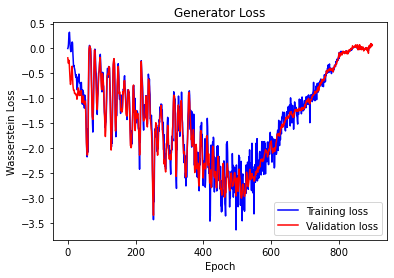

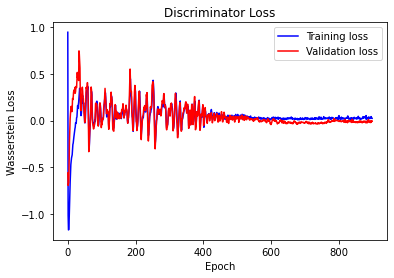

 47%|████▋     | 949/2000 [32:15<36:23,  2.08s/it]
Epoch 950:


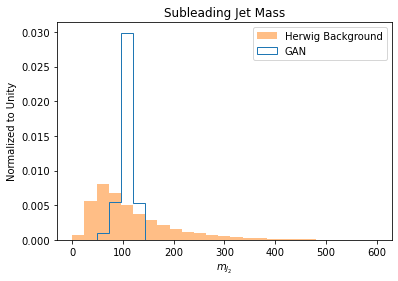

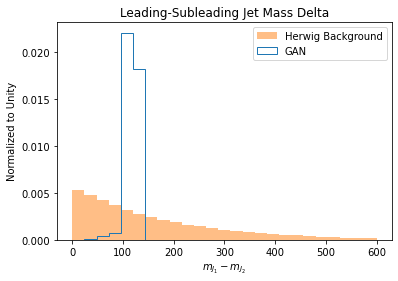

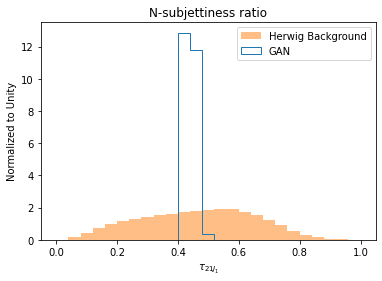

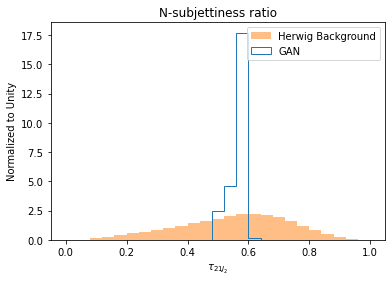

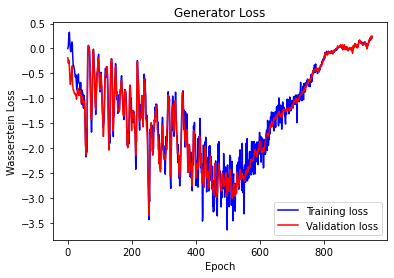

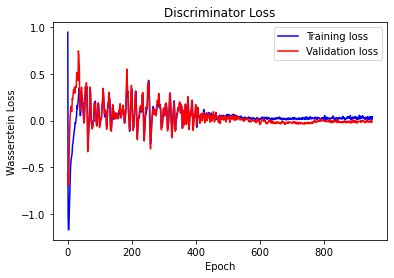

 50%|████▉     | 999/2000 [34:00<34:23,  2.06s/it]
Epoch 1000:


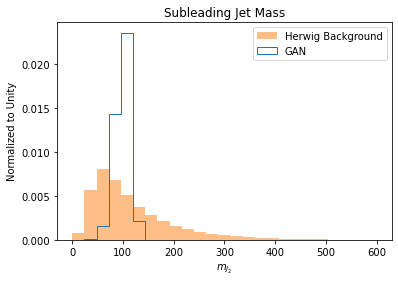

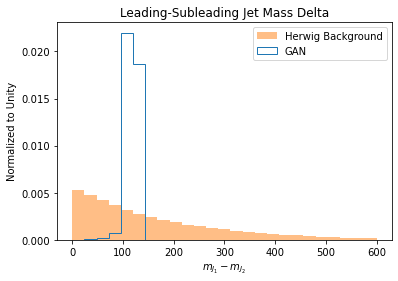

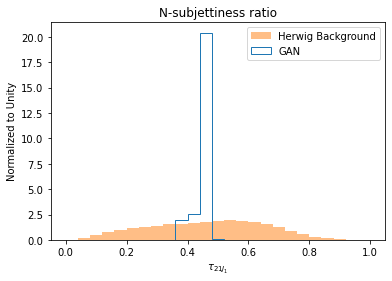

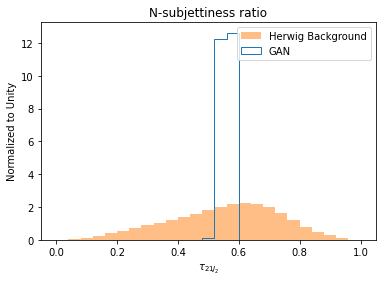

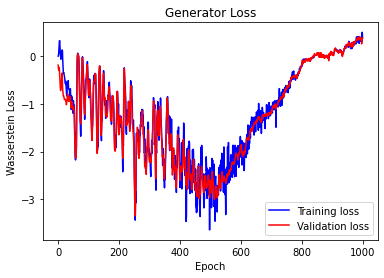

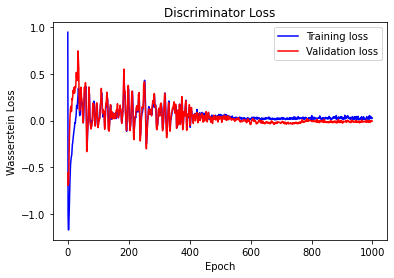

 52%|█████▏    | 1049/2000 [35:45<32:44,  2.07s/it]
Epoch 1050:


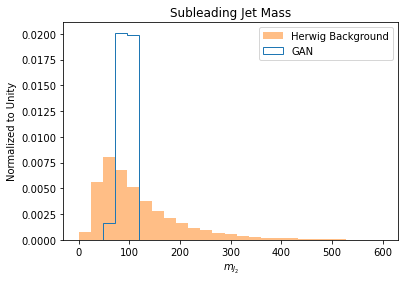

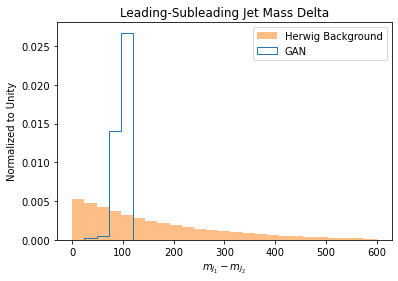

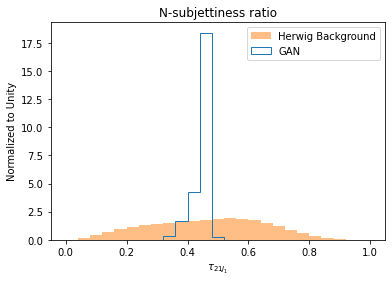

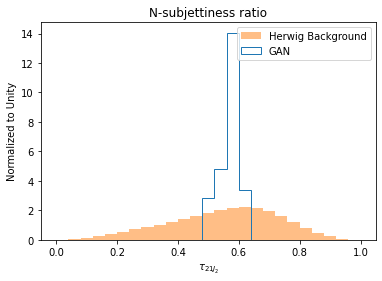

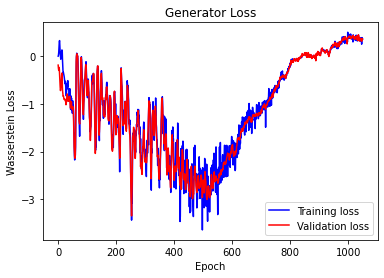

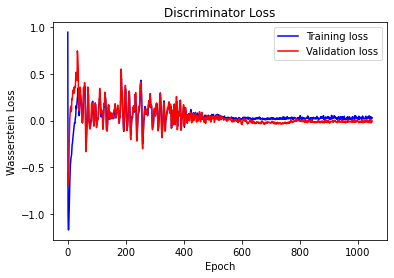

 55%|█████▍    | 1099/2000 [37:29<30:22,  2.02s/it]
Epoch 1100:


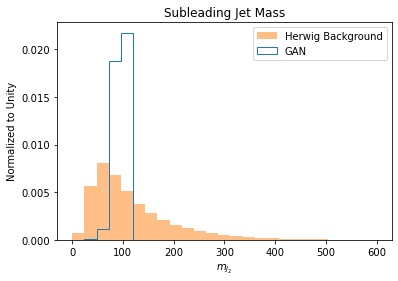

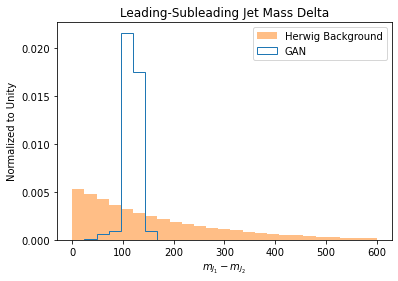

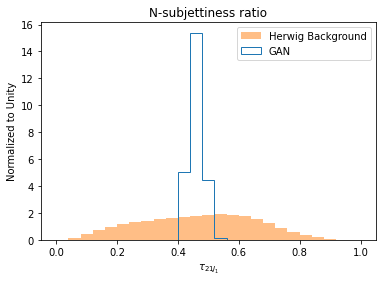

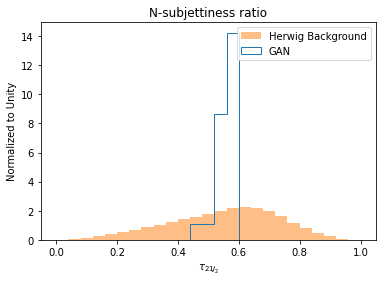

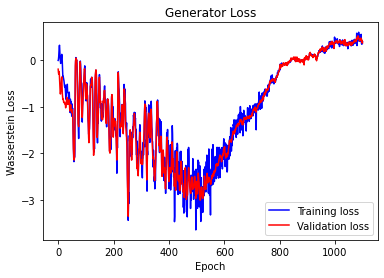

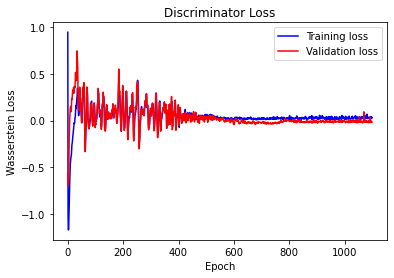

 57%|█████▋    | 1149/2000 [39:13<29:03,  2.05s/it]
Epoch 1150:


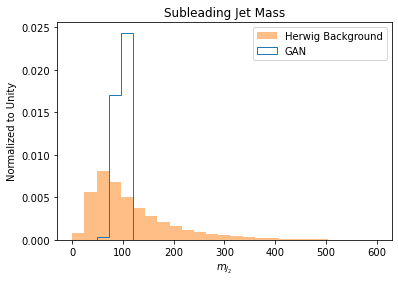

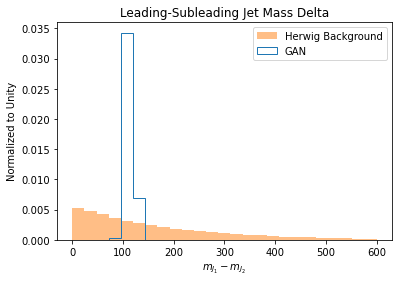

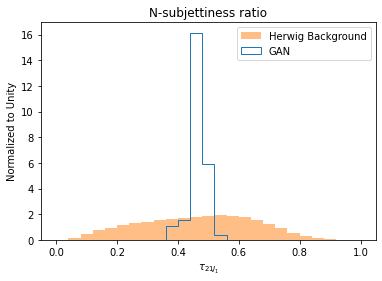

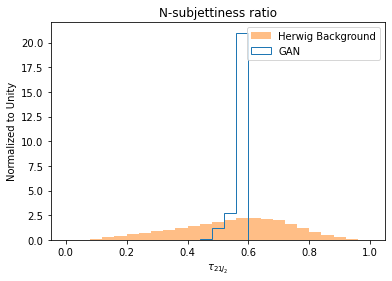

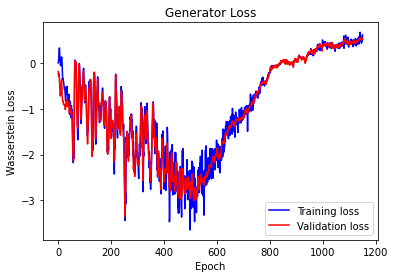

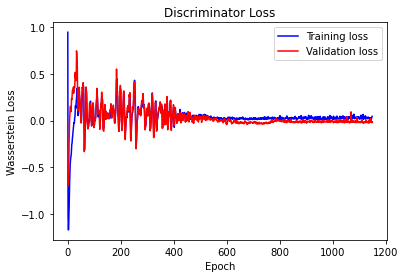

 60%|█████▉    | 1199/2000 [41:00<27:38,  2.07s/it]
Epoch 1200:


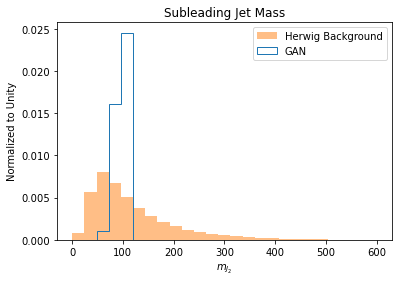

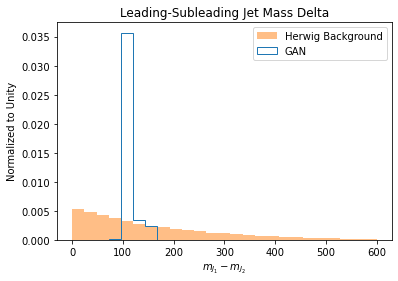

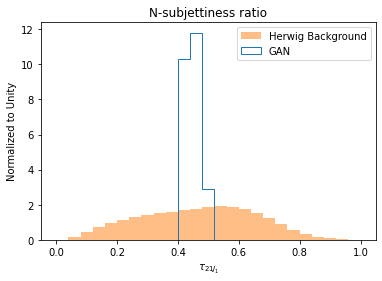

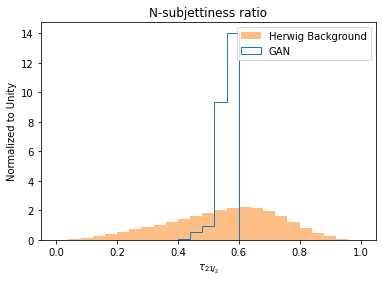

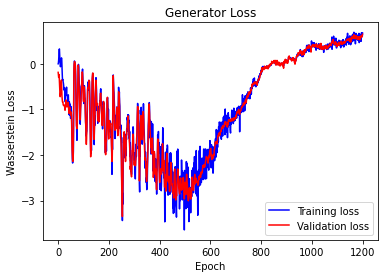

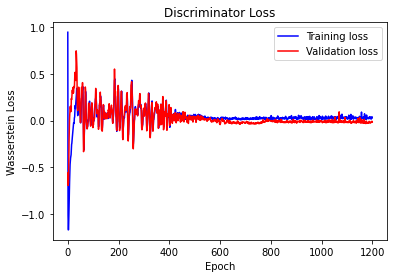

 62%|██████▏   | 1249/2000 [42:48<25:41,  2.05s/it]
Epoch 1250:


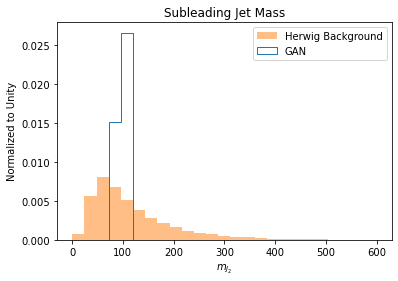

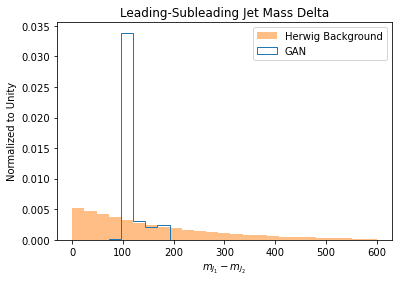

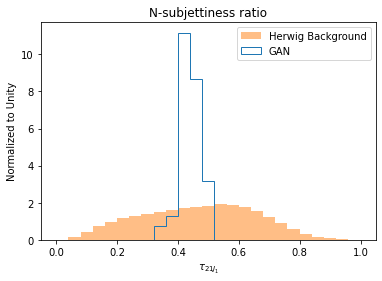

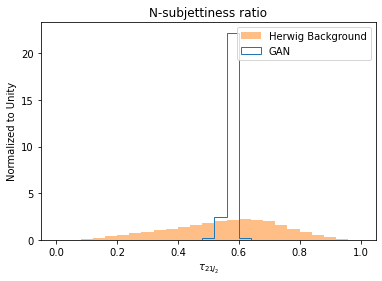

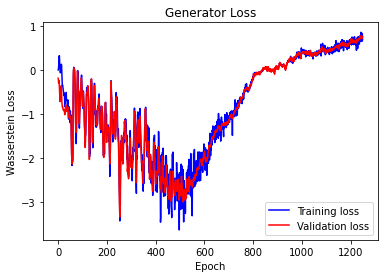

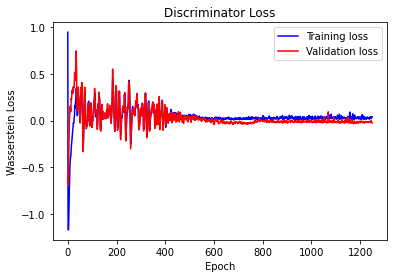

 65%|██████▍   | 1299/2000 [44:36<24:27,  2.09s/it]
Epoch 1300:


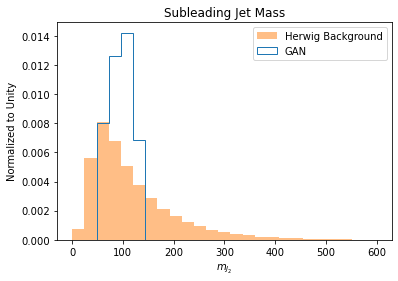

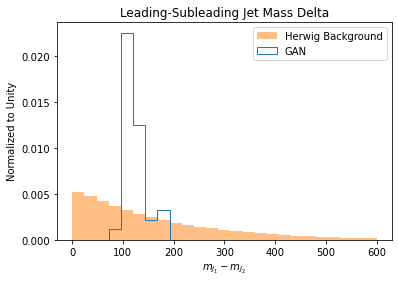

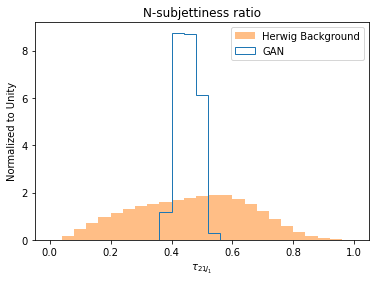

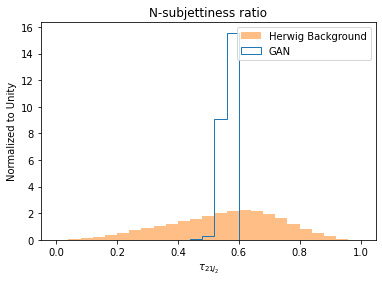

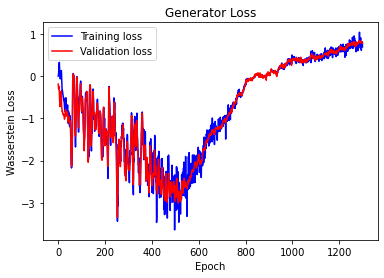

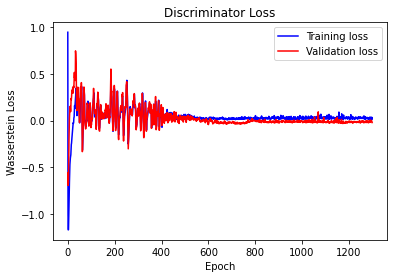

 67%|██████▋   | 1349/2000 [46:24<22:58,  2.12s/it]
Epoch 1350:


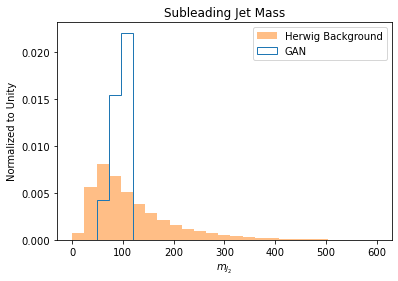

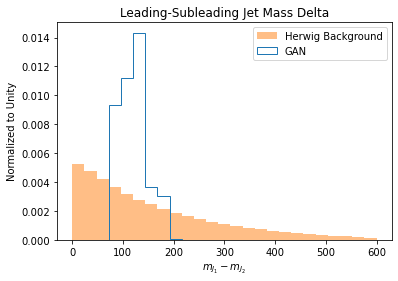

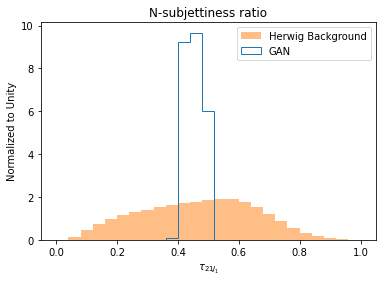

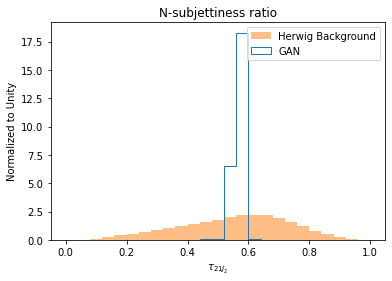

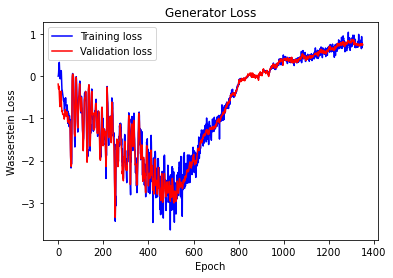

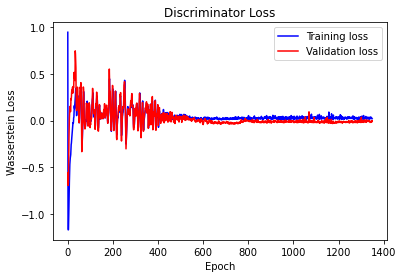

 70%|██████▉   | 1399/2000 [48:15<21:22,  2.13s/it]
Epoch 1400:


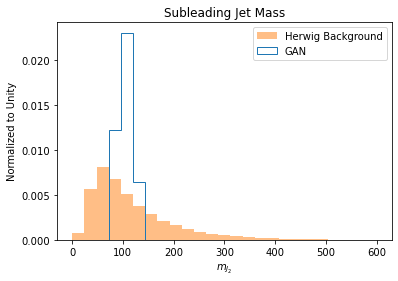

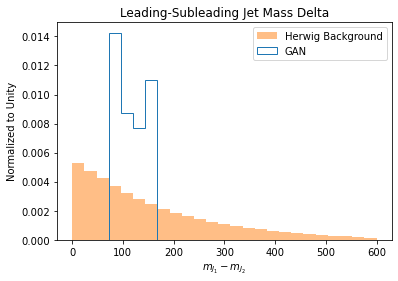

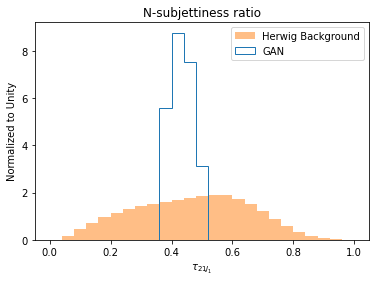

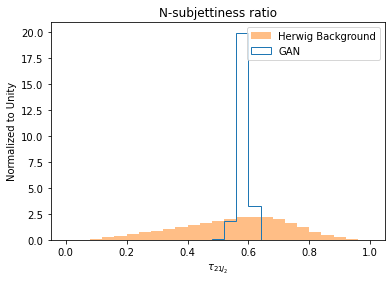

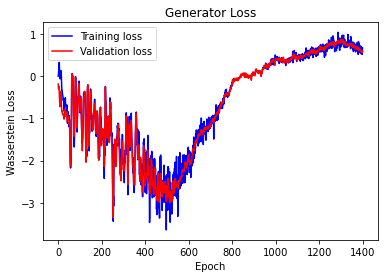

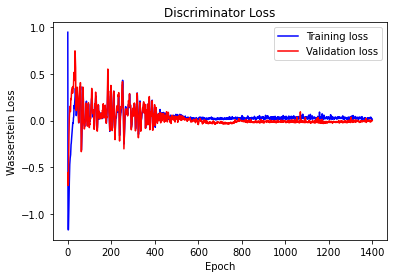

 72%|███████▏  | 1449/2000 [50:06<19:14,  2.10s/it]
Epoch 1450:


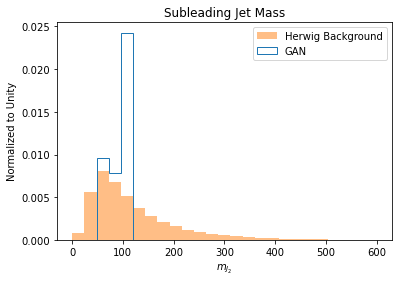

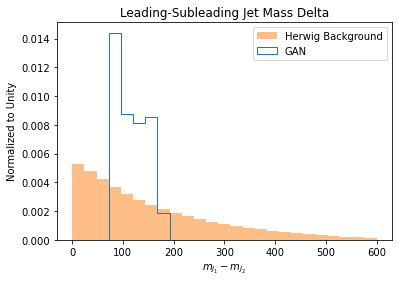

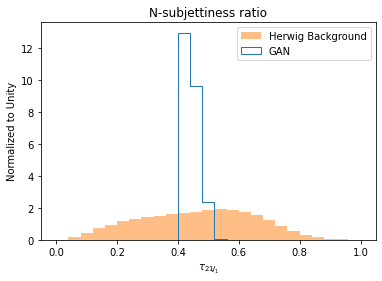

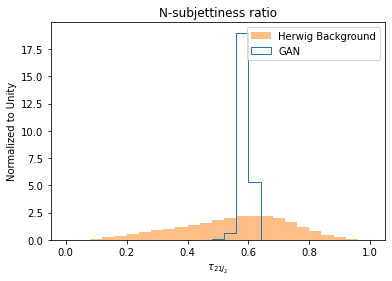

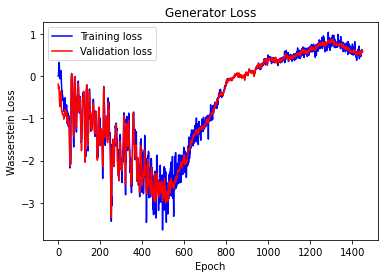

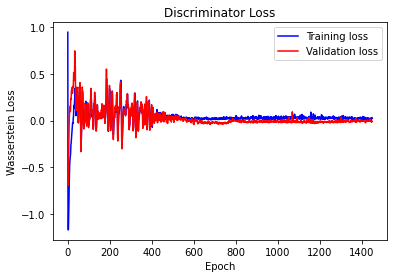

 75%|███████▍  | 1499/2000 [51:55<18:00,  2.16s/it]
Epoch 1500:


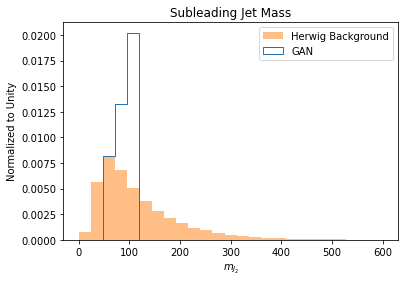

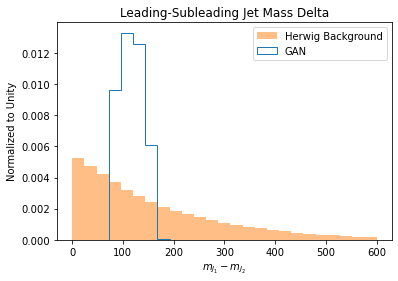

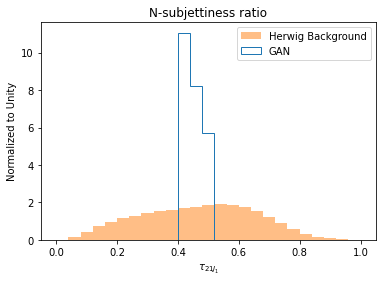

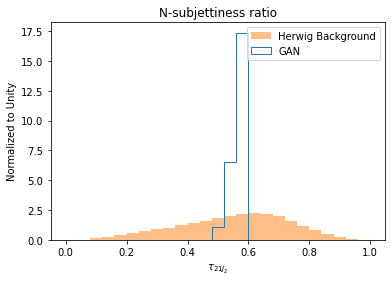

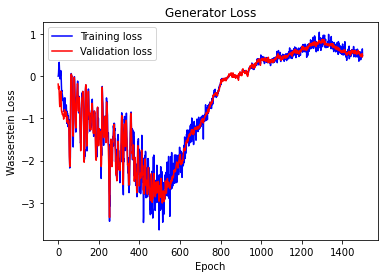

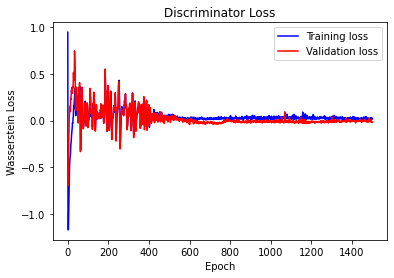

 77%|███████▋  | 1549/2000 [53:47<16:00,  2.13s/it]
Epoch 1550:


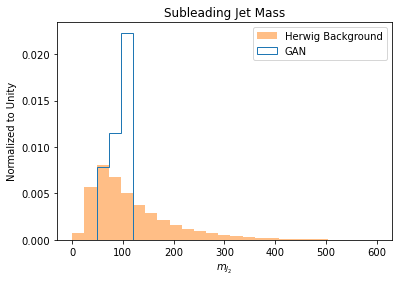

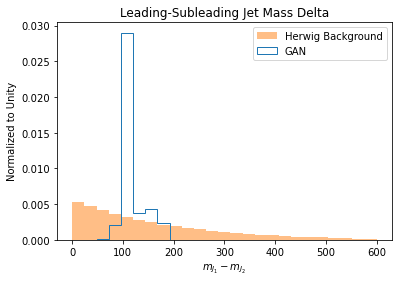

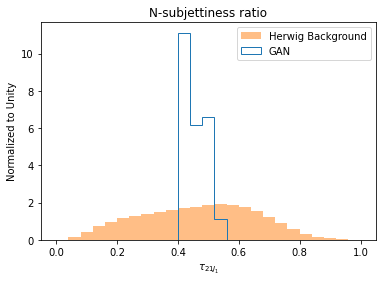

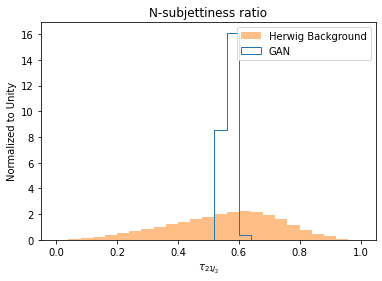

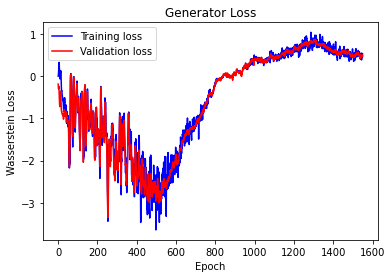

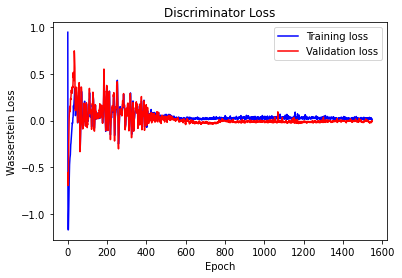

 80%|███████▉  | 1599/2000 [55:45<17:19,  2.59s/it]
Epoch 1600:


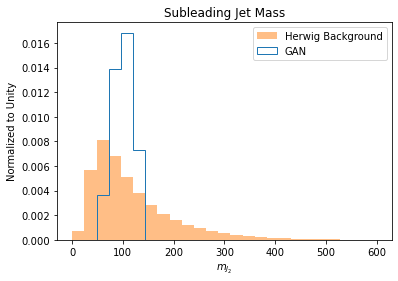

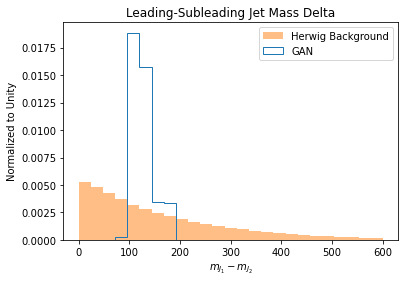

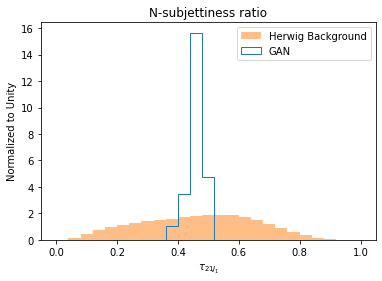

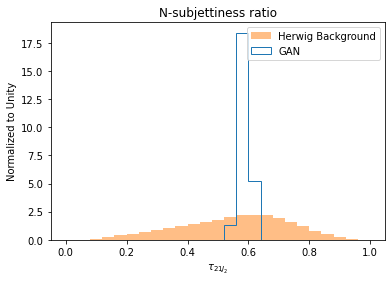

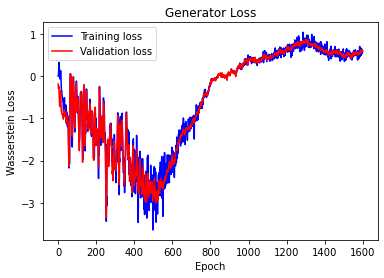

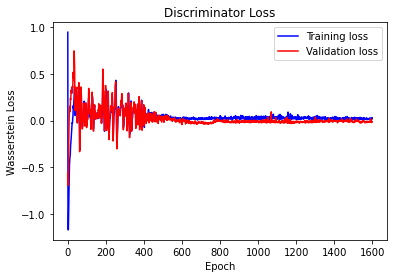

 82%|████████▏ | 1649/2000 [57:47<12:33,  2.15s/it]
Epoch 1650:


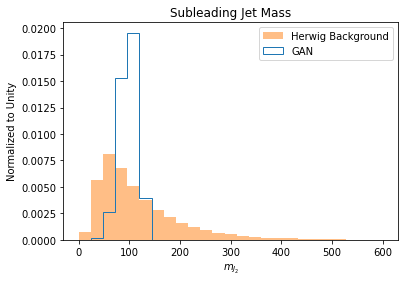

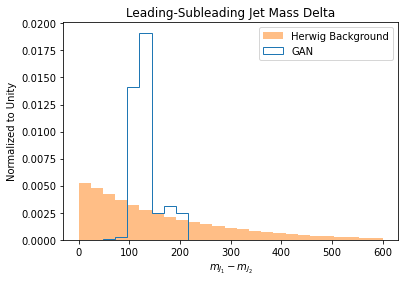

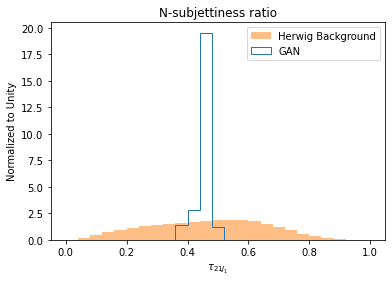

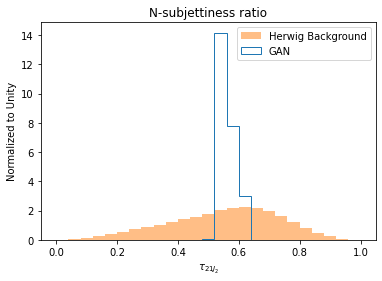

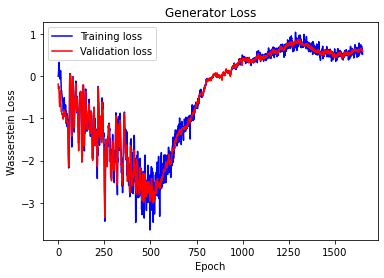

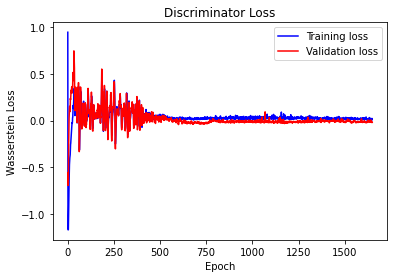

 85%|████████▍ | 1699/2000 [59:39<10:47,  2.15s/it]
Epoch 1700:


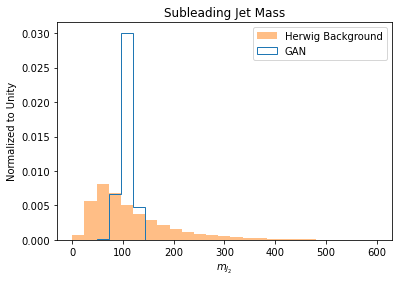

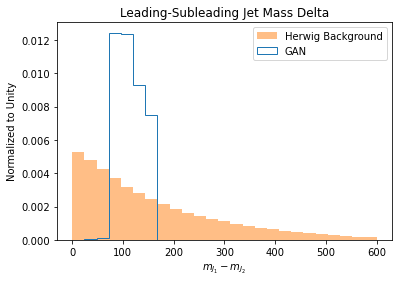

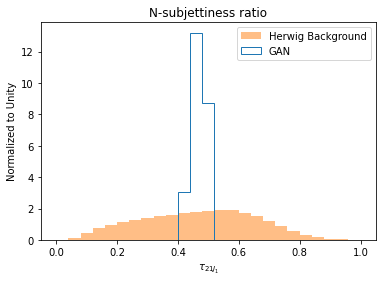

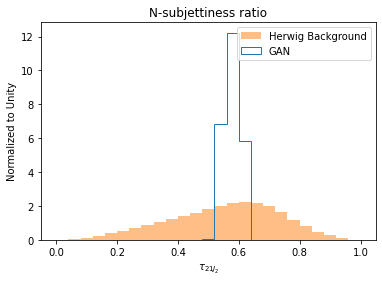

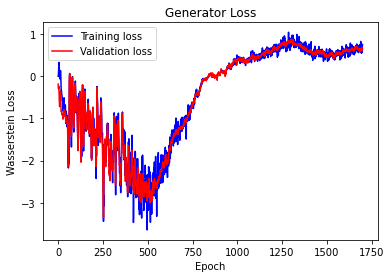

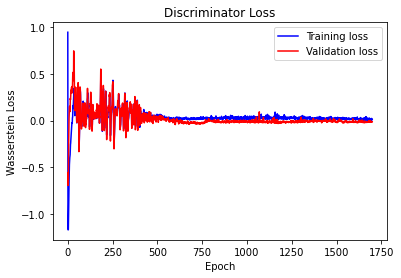

 87%|████████▋ | 1749/2000 [1:01:30<08:59,  2.15s/it]
Epoch 1750:


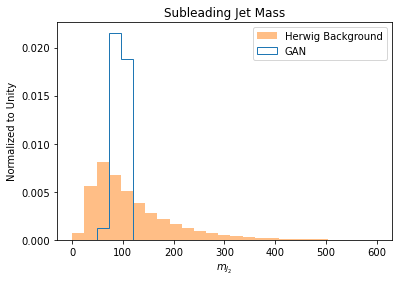

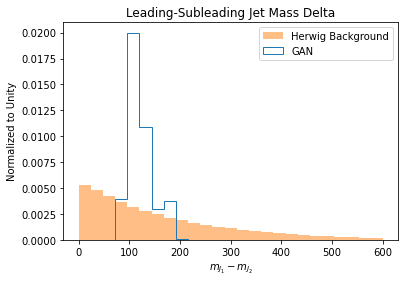

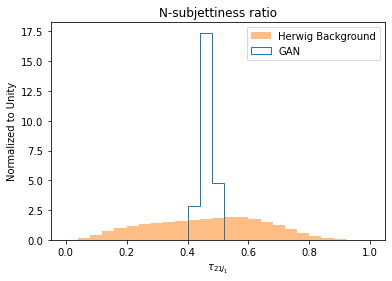

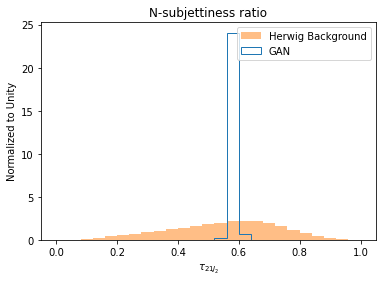

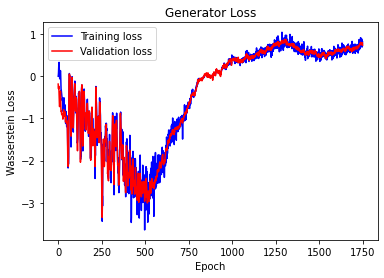

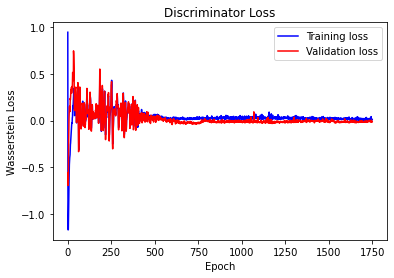

 90%|████████▉ | 1799/2000 [1:03:22<07:14,  2.16s/it]
Epoch 1800:


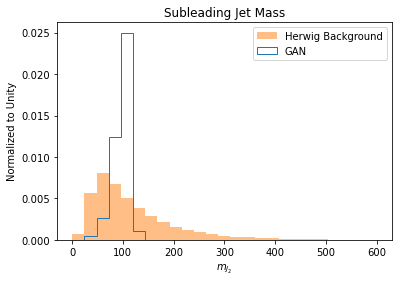

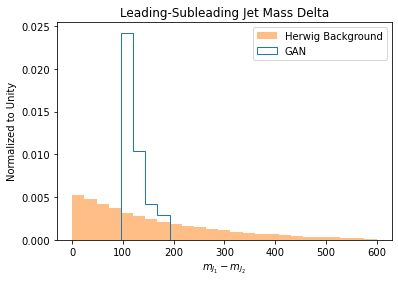

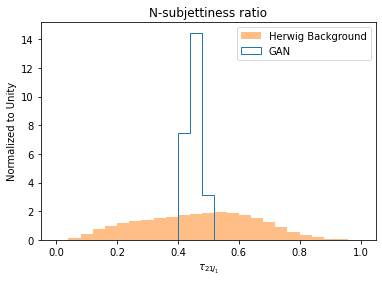

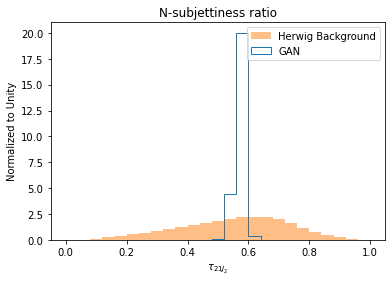

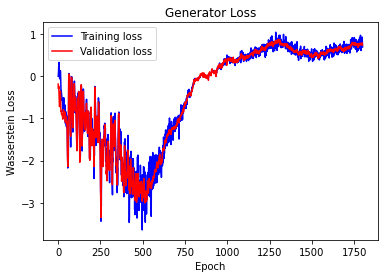

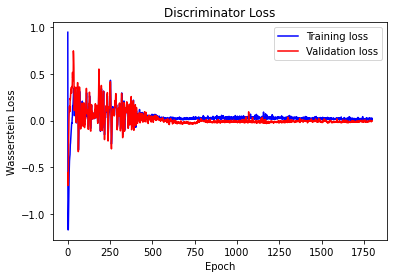

 92%|█████████▏| 1849/2000 [1:05:17<06:11,  2.46s/it]
Epoch 1850:


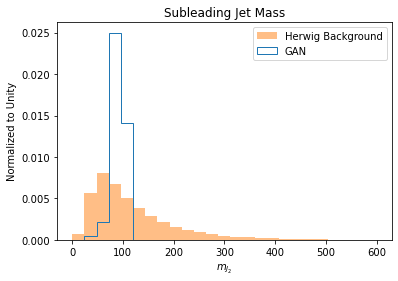

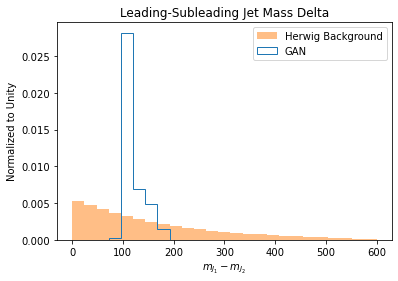

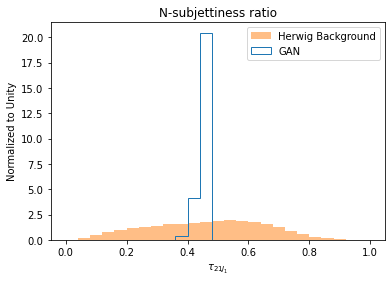

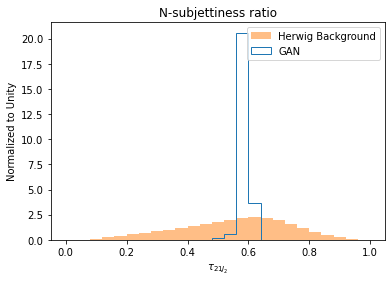

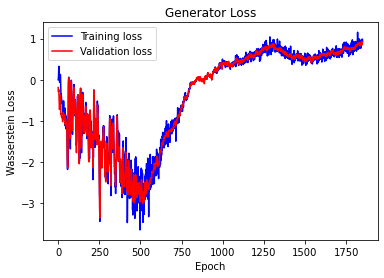

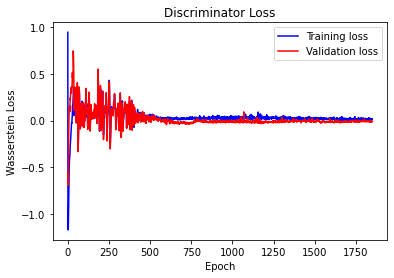

 95%|█████████▍| 1899/2000 [1:07:12<03:48,  2.26s/it]
Epoch 1900:


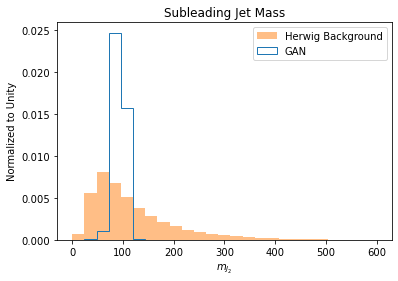

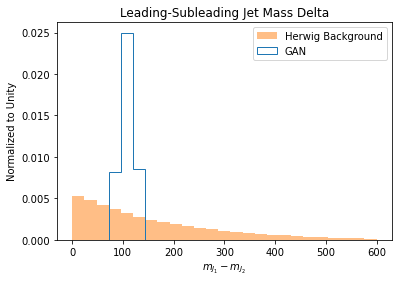

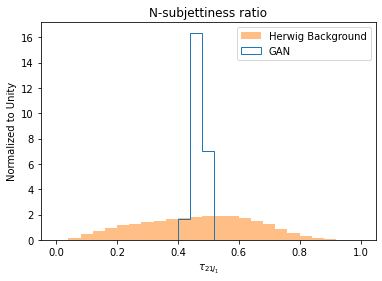

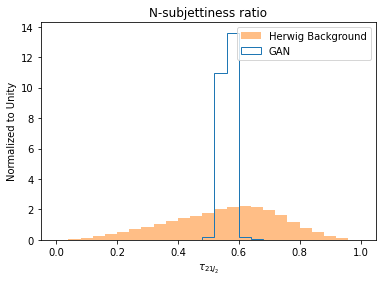

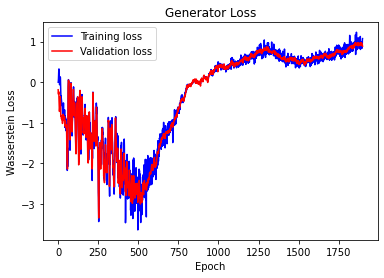

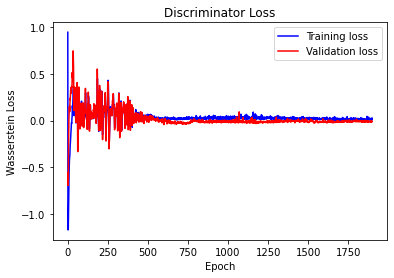

 97%|█████████▋| 1949/2000 [1:09:09<01:58,  2.33s/it]
Epoch 1950:


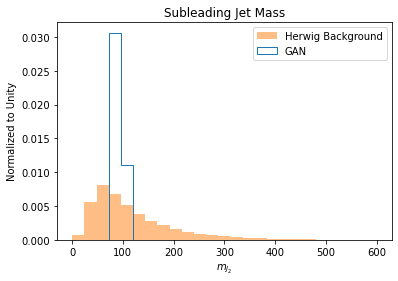

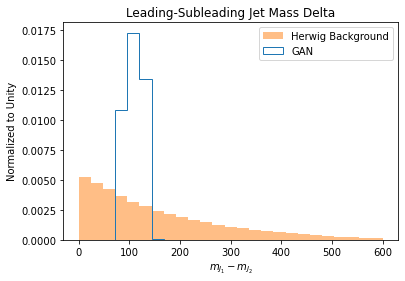

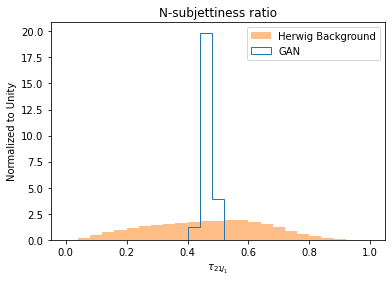

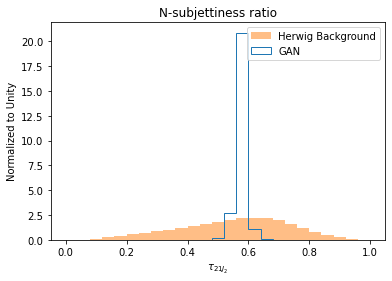

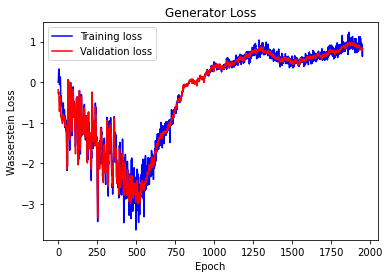

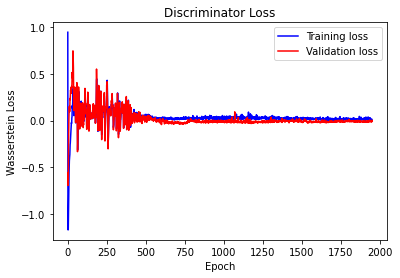

100%|█████████▉| 1999/2000 [1:11:05<00:02,  2.25s/it]
Epoch 2000:


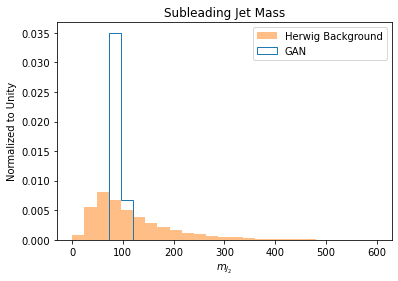

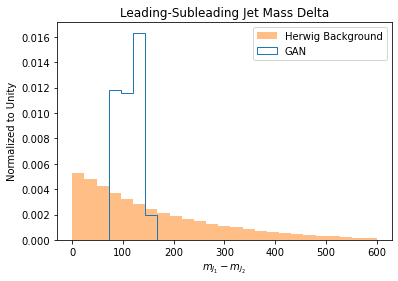

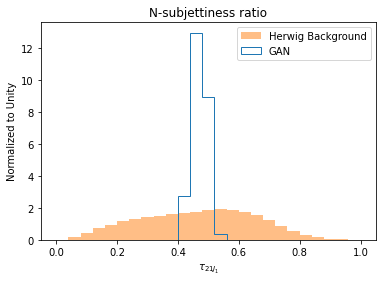

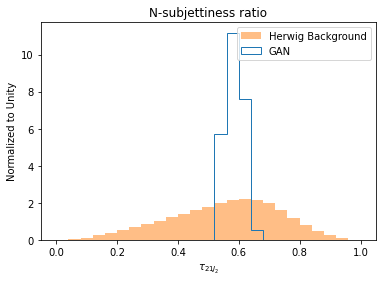

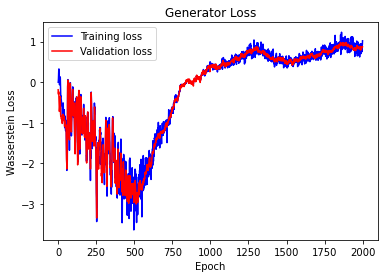

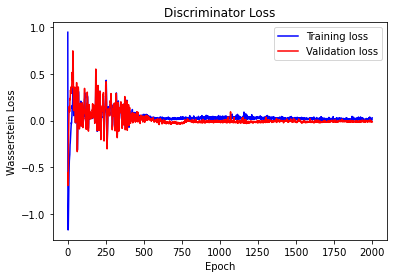

100%|██████████| 2000/2000 [1:11:10<00:00,  2.14s/it]


In [57]:
train(train_dataset, test_dataset, EPOCHS, N_CRITIC)

## Results
???